In [1]:
import pandas as pd
import numpy as np
import statistics as st
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV


In [2]:
red_wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv', sep = ';')
white_wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep = ';')

red_wine['Wine Type'] = 'Red'
red_wine['Quality Label'] = red_wine['quality'].apply(lambda value: 'Low'
if value <= 5 else 'Medium'
if value <= 7 else 'High')
red_wine['Quality Label'] = pd.Categorical(red_wine['Quality Label'],
categories=['Low', 'Medium', 'High'])
red_wine
white_wine['Wine Type'] = 'White'
white_wine['Quality Label'] = white_wine['quality'].apply(lambda value: 'Low'
if value <= 5 else 'Medium'
if value <= 7 else 'High')
white_wine['Quality Label'] = pd.Categorical(white_wine['Quality Label'],
categories=['Low', 'Medium', 'High'])
white_wine

wines = pd.concat([red_wine, white_wine])
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,Quality Label
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,White,Medium
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,White,Low
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,White,Medium
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,White,Medium


In [3]:
red_wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,Quality Label
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,Red,Low
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,Red,Medium
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,Red,Medium
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,Red,Low


In [5]:
sum_column = wines["fixed acidity"] + wines["volatile acidity"] + wines['citric acid']
wines["Total Acidity"] = sum_column
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,Quality Label,Total Acidity
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,8.68
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,8.60
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium,12.04
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,White,Medium,6.70
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,White,Low,7.28
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,White,Medium,6.93
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,White,Medium,6.09


In [6]:
new_column = wines['residual sugar'] / wines['Total Acidity']
wines['S.A.Ratio'] = new_column
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,Quality Label,Total Acidity,S.A.Ratio
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,8.68,0.299539
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,8.60,0.267442
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium,12.04,0.157807
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,White,Medium,6.70,0.238806
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,White,Low,7.28,1.098901
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,White,Medium,6.93,0.173160
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,White,Medium,6.09,0.180624


In [7]:
wines['Taste'] = wines['S.A.Ratio'].apply(lambda value: 'Dry' if  value <= 2 else 'Sweet')
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,Quality Label,Total Acidity,S.A.Ratio,Taste
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568,Dry
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,8.68,0.299539,Dry
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,8.60,0.267442,Dry
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium,12.04,0.157807,Dry
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568,Dry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,White,Medium,6.70,0.238806,Dry
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,White,Low,7.28,1.098901,Dry
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,White,Medium,6.93,0.173160,Dry
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,White,Medium,6.09,0.180624,Dry


In [8]:
wines = wines.rename(columns={"density": "Density", "alcohol": "Alcohol", 'quality' : 'Quality'})
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,Density,pH,sulphates,Alcohol,Quality,Wine Type,Quality Label,Total Acidity,S.A.Ratio,Taste
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568,Dry
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,8.68,0.299539,Dry
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,8.60,0.267442,Dry
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Medium,12.04,0.157807,Dry
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,8.10,0.234568,Dry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,White,Medium,6.70,0.238806,Dry
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,White,Low,7.28,1.098901,Dry
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,White,Medium,6.93,0.173160,Dry
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,White,Medium,6.09,0.180624,Dry


In [9]:
wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,Density,pH,sulphates,Alcohol,Quality,Total Acidity,S.A.Ratio
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,7.873606,0.716897
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,1.388024,0.640924
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,4.130000,0.064586
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,7.020000,0.222222
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,7.600000,0.381679
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,8.380000,1.094675
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,17.045000,7.026161


In [69]:
data = wines['Quality Label'].value_counts(ascending= True )
data

High       198
Low       2384
Medium    3915
Name: Quality Label, dtype: int64

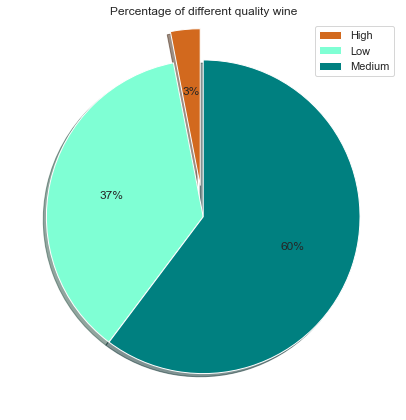

In [113]:
labels = data.index
colors = ['chocolate','aquamarine', 'teal'] 
explode =(0.2,0,0) 
fig, ax1 = plt.subplots(figsize = (12,6)) 
ax1.pie(data.values, explode = explode, colors=colors, startangle=90, autopct='%.0f%%', shadow = True) 
plt.title('Percentage of different quality wine') 
ax1.legend(labels, loc ='upper right') 
plt.tight_layout() 
plt.show()
fig.savefig('svm_conf.png', dpi=400)

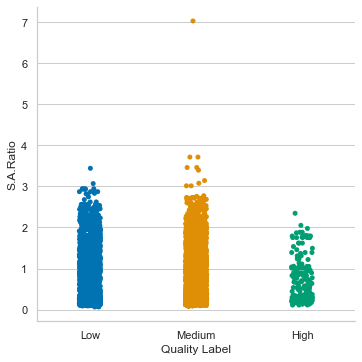

In [111]:
sns.catplot(x="Quality Label", y="S.A.Ratio", data=wines, ci= None, palette= 'colorblind')

Text(0.5, 0.98, 'Taste vs S.A.Ratio')

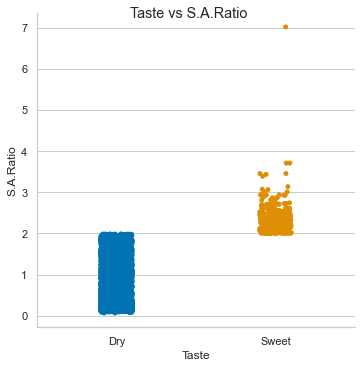

In [112]:
g = sns.catplot(x="Taste", y="S.A.Ratio",
                data=wines,palette= 'colorblind' 
                );
g.fig.suptitle('Taste vs S.A.Ratio')


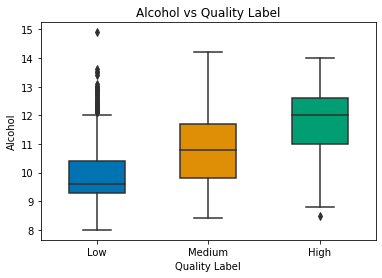

In [16]:
g = sns.boxplot(data=wines, x="Quality Label", y= 'Alcohol', width= 0.5, saturation= 1, palette= 'colorblind').set_title('Alcohol vs Quality Label')



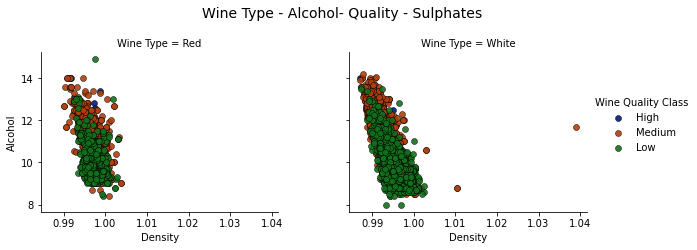

In [17]:
g = sns.FacetGrid(wines, col="Wine Type", hue='Quality Label', 
col_order=['Red', 'White'], hue_order=['High', 'Medium', 'Low'],
aspect=1.2, size=3.5, palette= 'dark')
g.map(sns.scatterplot, "Density", "Alcohol", alpha=0.9,
edgecolor='black', linewidth=0.5, ci= None, )
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol- Quality - Sulphates', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

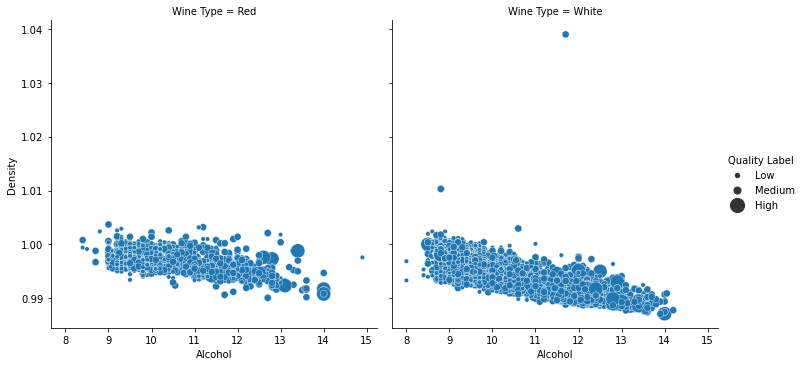

In [18]:
sns.relplot(
    data=wines,
    x="Alcohol", y="Density", col="Wine Type",
    size="Quality Label", sizes= [20, 50, 200] ,palette='dark',
)

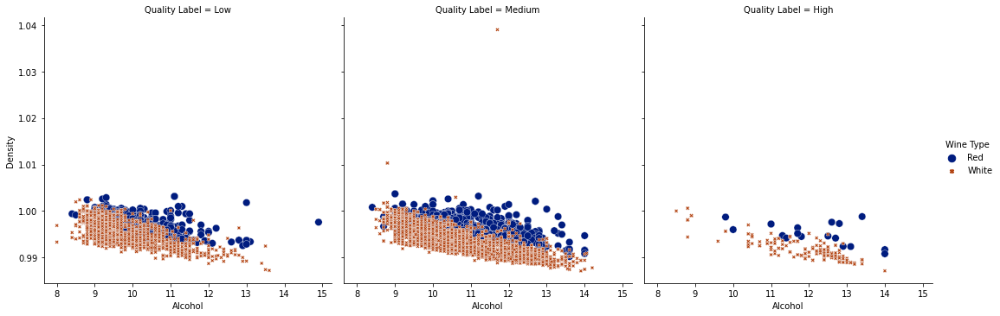

In [20]:
sns.relplot(
    data=wines,
    x="Alcohol", y="Density", col="Quality Label",
    hue="Wine Type", style="Wine Type", size="Wine Type", palette='dark',
);

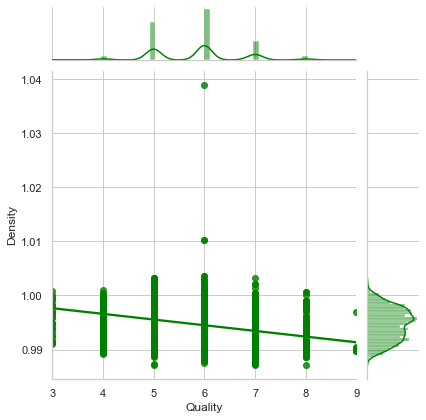

In [105]:
sns.jointplot(x='Quality' , y='Density', data= wines, kind='reg', color= 'green')

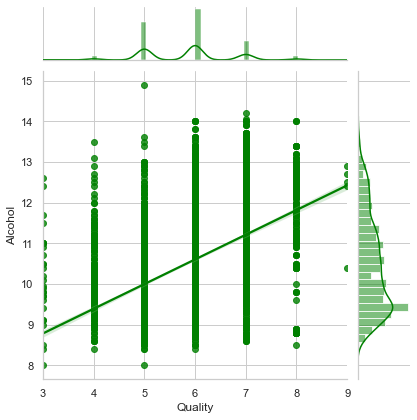

In [95]:
sns.jointplot(x='Quality' , y='Alcohol', data= wines, kind='reg', color= 'green')